# Load Packages

In [1]:
library(tidyverse)
library(AER)
library(plotly)

-- Attaching packages --------------------------------------- tidyverse 1.3.0 --

v ggplot2 3.3.3     v purrr   0.3.4
v tibble  3.1.0     v dplyr   1.0.5
v tidyr   1.1.3     v stringr 1.4.0
v readr   1.4.0     v forcats 0.5.1

-- Conflicts ------------------------------------------ tidyverse_conflicts() --
x dplyr::filter() masks stats::filter()
x dplyr::lag()    masks stats::lag()

Loading required package: car

Loading required package: carData


Attaching package: 'car'


The following object is masked from 'package:dplyr':

    recode


The following object is masked from 'package:purrr':

    some


Loading required package: lmtest

Loading required package: zoo


Attaching package: 'zoo'


The following objects are masked from 'package:base':

    as.Date, as.Date.numeric


Loading required package: sandwich

Loading required package: survival


Attaching package: 'plotly'


The following object is masked from 'package:ggplot2':

    last_plot


The following object is masked fro

# Problem

Estimate statistical uncertainly in measured energy savings and behavior adoption in randomized encouragement design.

- Treatment group: encouraged to use Streetwyze app
- Control group: not encouraged to use the Streetwyze app
- Encouragement is "Instrumental Variable"
- Need to measure outcome (energy savings) contingent on using the app
- What would be a reasonable target sample size?

# Power analysis: difference in means between groups (T-test)

Given some assumed "true" effect size (between-group delta) and some assumed "true" standard deviation, what is the probability that our study will detect an effect size with a 95% CI that excludes zero, i.e. is "statistically significant." 

In [2]:
esave = 0.05  # True difference in energy savings between groups
esave_sd = 0.1 # True standard deviation of the population
n_per_group = 50 # Our sample size for each group
# "power" in output is probability that our study will detect a non-zero effect 
power.t.test(n = n_per_group, delta = esave, sd = esave_sd)


     Two-sample t test power calculation 

              n = 50
          delta = 0.05
             sd = 0.1
      sig.level = 0.05
          power = 0.6968888
    alternative = two.sided

NOTE: n is number in *each* group


# Power analysis: difference in means between groups (T-test)
More typically we want know what sample size would be required to detect a difference between groups with a target power level (typically 80%). 


In [3]:
esave = 0.05  # True difference in energy savings between groups
esave_sd = 0.1 # True standard deviation of the population
n_per_group = "???" # Our sample size for each group
power = 0.8
# "power" in output is probability that our study will detect a non-zero effect 
power.t.test(delta = esave, sd = esave_sd, power = .8)


     Two-sample t test power calculation 

              n = 63.76576
          delta = 0.05
             sd = 0.1
      sig.level = 0.05
          power = 0.8
    alternative = two.sided

NOTE: n is number in *each* group


# Problem

Unlike basic power , need to consider the effect of different app adoption rates in each group:

- Treatment group (N) -> Encouragement -> N*AdoptRateTrt -> % energy savings
- Control group (N) -> No Encouragement -> N*AdoptRateCtrl -> % energy savings
- Encouragement is "Instrumental Variable"
- Need to measure outcome (energy savings) contingent on using the app


Solution: Simulation
========================================================
Use simulation to estimate statistical uncertainty and power under a range of:

- Control and Treatment app adoption rates
- Sample sizes
- Effect sizes
- Sample variation

Step 1: Generate fake data
========================================================
1. Randomly assign N people to study groups (not evenly split)
2. Simulate each participant app adoption outcome with different probability depending on study group
3. Simulation each participant pre-post energy savings outcome with different means depending on study group
4. Combine and return results in data frame for analysis

In [5]:
####### RED SIM FUNCTION ##########
sim_red <- function(sample_size = 50, 
                    esave_est_app = 0.05,
                    esave_est_noapp = 0,
                    esave_sd = 0.05,
                    p_adopt_encouraged = 0.5,
                    p_adopt_noencourage = 0.1) 
  {
  
  # Randomly assign N people to the treatment group
  encouraged <- c(0,1)
  is_encouraged <- sample(encouraged, size = sample_size, replace = TRUE)  # random assignment of encouragment
  
  # vectors for probabilities of app adoption given encouragement
  adopts <- c(0,1)
  adopt_probs_encouraged <- c(1-p_adopt_encouraged, p_adopt_encouraged)
  adopt_probs_noencouraged <- c(1-p_adopt_noencourage, p_adopt_noencourage)
  
  # simulate app adoption with different probs based on encouragement status
  use_app <- sapply(is_encouraged, function(x) 
    ifelse(x==1, 
           sample(adopts, size = 1, prob = adopt_probs_encouraged),
           sample(adopts, size = 1, prob = adopt_probs_noencouraged)))
  

  # Depending on whether a participant uses app, sample normal distribution
  # with different means to simulate each participant outcome
  esave <- sapply(use_app, function(x)
    ifelse(x==1, 
           rnorm(sample_size, 
                 mean = esave_est_app,
                 sd = esave_sd ),
           rnorm(sample_size, 
                 mean = esave_est_noapp,
                 sd = esave_sd)
    )
  )
  
  
  # combine results in a data frame
  df <- data.frame(id = 1:sample_size, 
                   is_encouraged = is_encouraged,
                   use_app = use_app,
                   esave = esave)
  
 return(df)
}


In [6]:
head(sim_red())

,id,is_encouraged,use_app,esave
,<int>,<dbl>,<dbl>,<dbl>
1,1,1,1,0.06166960
2,2,1,1,0.02568989
3,3,0,0,-0.02454562
4,4,0,0,0.04222171
5,5,1,0,-0.05333469
6,6,1,1,0.01956892


Step 2: Analyze fake data
========================================================

In [10]:
fake <- sim_red(sample_size = 100)
# adoption rates for this sample
adopt_rates <- round(tapply(fake$use_app , fake$is_encouraged, mean),3)
names(adopt_rates) <- c("Non-encouraged adopt rate: ", "Encouraged adopt rate: ")
adopt_rates[2]
adopt_rates[1]
# energy savings range for adopters and non-adopters
esavings <- round(tapply(fake$esave, fake$use_app, mean),3)
names(esavings) <- c("Non-app user savings: ", "App user savings: ")
esavings[2]
esavings[1]
# Instrumental Two-stage regression
ivlm <- AER::ivreg(esave ~ use_app | is_encouraged, data = fake)
ci95 <- confint(ivlm)
round(coef(ivlm)[2],3) 
ci95

Encouraged adopt rate:  
                  0.404

Non-encouraged adopt rate:  
                      0.047

App user savings:  
             0.028

Non-app user savings:  
                 0.013

use_app 
  0.026

,2.5 %,97.5 %
(Intercept),-0.006564218,0.02796580
use_app,-0.030546189,0.08223604


# Step 3a: Analyze fake data 10 times!

First, I make a function that makes fake data with the "sim_red" function, estimates the savings with a two-stage OLS regression model and then returns the savings paramter estimate with the 95% confidence interval.

The I run the function 10 times and plot the results to see how random variation of creates slightly different savings estimates and confidence intervals each time the study is simulated.

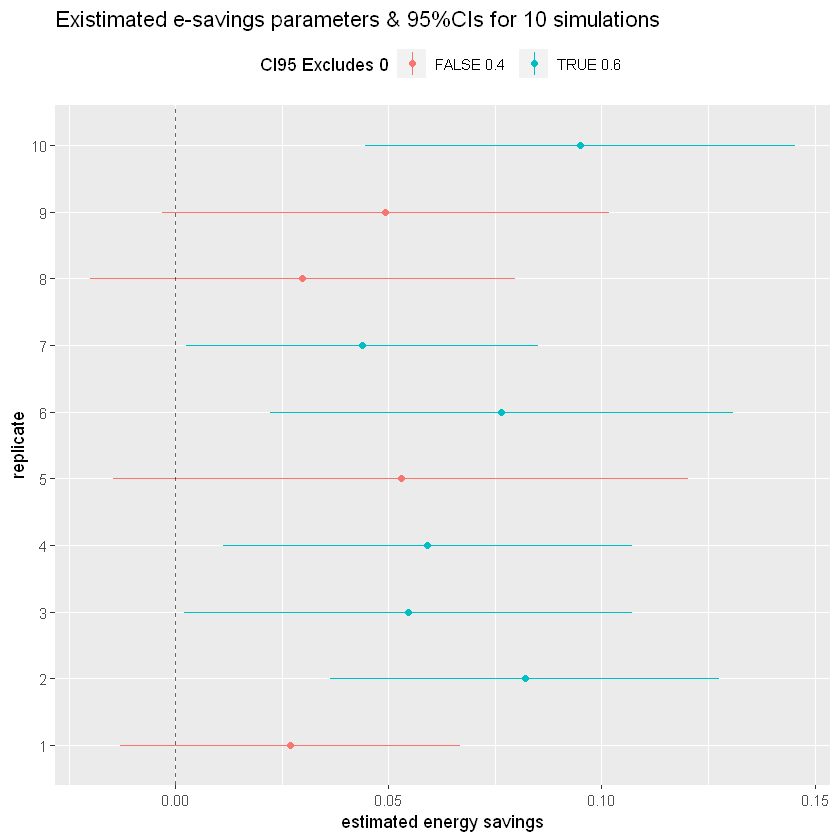

In [11]:
ivlm_rep <- function(x = 100){
    fake <- sim_red(sample_size = x)
    ivlm <- AER::ivreg(esave ~ use_app | is_encouraged, data = fake)
    ci95 <- confint(ivlm)[2,]
    ci95[3] <- coef(ivlm)[2]
    names(ci95) <- c("lwr", "upr", "est")
    return(ci95)

}
out <- rep(100, 10)
res <- bind_rows(lapply(out, ivlm_rep))%>% mutate(rep = 1:n(), excludes_zero = lwr>0)

ggplot(data = res, aes(color = excludes_zero))+
geom_point(aes(x = factor(rep), y = est))+
geom_linerange(aes(x = rep, ymin = lwr, ymax = upr))+
geom_hline(yintercept = 0, alpha = 0.6, linetype = "dashed")+
labs(x = "replicate", y = "estimated energy savings",
    title = paste0("Existimated e-savings parameters & 95%CIs for ",nrow(res), " simulations"))+
scale_color_discrete(name = "CI95 Excludes 0",
                    labels = paste(c("FALSE", "TRUE"), 
                                   round(c(1-mean(res$excludes_zero), mean(res$excludes_zero)),3))
                    )+
theme(legend.position = "top")+
coord_flip()


Step 3: Analyze fake data 1000 times!
========================================================

In [12]:
N <- 1000
out <- vector(mode = "list", length = N)
for(i in seq_along(out)){
  fake = sim_red(sample_size = 100)
  ivlm <- AER::ivreg(esave ~ use_app | is_encouraged, data = fake)
  ci95 <- confint(ivlm)[2,]
  out[[i]] <- ci95
}

Step 4: Estimate statistical power
========================================================

In [13]:
out_df <- bind_rows(out)  # convert to a data frame
names(out_df) <- c("lwr2.5", "upr97.5")
out_df <- out_df %>%
  mutate(ci95_excludes_zero = lwr2.5>0,
         ci95_contains_delta = lwr2.5 <= 0.05 & upr97.5 >= 0.05)

res <- apply(out_df[,3:4],2,mean)
res[1]
res[2]

ci95_excludes_zero 
             0.522

ci95_contains_delta 
              0.959

Step 5: Repeat across a range of parameter values
========================================================
Repeat across a range of app adoption rates, effects sizes, effect standard deviations, and samples size to explore the leverage points and potential limitations of the study. 

First lets look at sample size. To make running simulations across a range of values for a single paramter, I created a helper function called "run_sim" which takes a control list as an input and returns the simulation runs and a summary table.

In [14]:
source("helpers.R")
rerun = FALSE

ctrl <- as.list(formals(sim_red))
ctrl_names <- names(ctrl)
ctrl$sample_size <- seq(100, 500, by = 100)  # range of sample sizes to try
ctrl$esave_sd <- 0.1                         # standard deviation of energy savings
ctrl$p_adopt_encouraged <- 0.7               # assumed app adoption rate of encouraged group (treatment)
ctrl$p_adopt_noencourage <- 0.05              # assumed app adoption rate of non-encouraged group (control)
ctrl$mvar <- "esave"                         # response variable (can also be behavior change)
ctrl$output <- "iv_reg_ols"                  # function can return data only or results of different analyses
ctrl <- ctrl[ctrl_names]                     # make the order of list elemements same as default

ctrl

# simulation results 1000 times for each sample size
if(rerun){
    results <- run_sim(reps = 1000, ctrl = ctrl)
    
    saveRDS(results, "sample_grid_output/esave_sample_size_sim_results.rds")
} 
 


  

Loading required package: Rcpp

Registered S3 methods overwritten by 'lme4':
  method                          from
  cooks.distance.influence.merMod car 
  influence.merMod                car 
  dfbeta.influence.merMod         car 
  dfbetas.influence.merMod        car 

Loading 'brms' package (version 2.15.0). Useful instructions
can be found by typing help('brms'). A more detailed introduction
to the package is available through vignette('brms_overview').


Attaching package: 'brms'


The following object is masked from 'package:survival':

    kidney


The following object is masked from 'package:stats':

    ar


This is rstanarm version 2.21.1

- See https://mc-stan.org/rstanarm/articles/priors for changes to default priors!

- Default priors may change, so it's safest to specify priors, even if equivalent to the defaults.

- For execution on a local, multicore CPU with excess RAM we recommend calling

  options(mc.cores = parallel::detectCores())


Attaching package: 'rstanarm'


$sample_size
[1] 100 200 300 400 500

$esave_est_app
[1] 0.05

$esave_est_noapp
[1] 0

$esave_sd
[1] 0.1

$ebehave_rate_app
[1] 0.15

$ebehave_rate_noapp
[1] 0.1

$ebehave_sd
[1] 0.05

$p_adopt_encouraged
[1] 0.7

$p_adopt_noencourage
[1] 0.05

$mvar
[1] "esave"

$output
[1] "iv_reg_ols"

We can see from this simulation, we need a sample size of around 300 total participants to acheive 80% power under these assumptions:
- Energy savings effect is 5% in treatment group and 0% in control
- Energy savings standard deviation is 10%
- 70% of those encouraged actually use the app (treatment group)
- 5% of those not encouraged use the app (control)

In [15]:
results <- readRDS("sample_grid_output/esave_sample_size_sim_results.rds")
pdat <- results$summary_table %>%
rename(power = exclude_zero_rate) %>%
select(sample_size, power)%>%
mutate(above_80power = power > 0.8)

p <- ggplot(data = pdat, aes(x = sample_size, y = power))+
geom_path()+
geom_point(aes(color = above_80power))+
geom_hline(yintercept = .8, linetype = "dashed", alpha = .5)+
theme(legend.position = "top")
embed_notebook(ggplotly(p))

<iframe src="data:text/html;charset=utf-8;base64,PCFET0NUWVBFIGh0bWw+DQo8aHRtbD4NCjxoZWFkPg0KPG1ldGEgY2hhcnNldD0idXRmLTgiIC8+DQo8dGl0bGU+cGxvdGx5PC90aXRsZT4NCjxzY3JpcHQ+KGZ1bmN0aW9uKCkgew0KICAvLyBJZiB3aW5kb3cuSFRNTFdpZGdldHMgaXMgYWxyZWFkeSBkZWZpbmVkLCB0aGVuIHVzZSBpdDsgb3RoZXJ3aXNlIGNyZWF0ZSBhDQogIC8vIG5ldyBvYmplY3QuIFRoaXMgYWxsb3dzIHByZWNlZGluZyBjb2RlIHRvIHNldCBvcHRpb25zIHRoYXQgYWZmZWN0IHRoZQ0KICAvLyBpbml0aWFsaXphdGlvbiBwcm9jZXNzICh0aG91Z2ggbm9uZSBjdXJyZW50bHkgZXhpc3QpLg0KICB3aW5kb3cuSFRNTFdpZGdldHMgPSB3aW5kb3cuSFRNTFdpZGdldHMgfHwge307DQoNCiAgLy8gU2VlIGlmIHdlJ3JlIHJ1bm5pbmcgaW4gYSB2aWV3ZXIgcGFuZS4gSWYgbm90LCB3ZSdyZSBpbiBhIHdlYiBicm93c2VyLg0KICB2YXIgdmlld2VyTW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy52aWV3ZXJNb2RlID0NCiAgICAgIC9cYnZpZXdlcl9wYW5lPTFcYi8udGVzdCh3aW5kb3cubG9jYXRpb24pOw0KDQogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIFNoaW55IG1vZGUuIElmIG5vdCwgaXQncyBhIHN0YXRpYyBkb2N1bWVudC4NCiAgLy8gTm90ZSB0aGF0IHN0YXRpYyB3aWRnZXRzIGNhbiBhcHBlYXIgaW4gYm90aCBTaGlueSBhbmQgc3RhdGljIG1vZGVzLCBidXQNCiAgLy8gb2J2aW91c2x5LCBTaGlueSB3aWRnZXRzIGNhbiBvbmx5IGFwcGVhciBpbiBTaGlueSBhcHBzL2RvY3VtZW50cy4NCiAgdmFyIHNoaW55TW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy5zaGlueU1vZGUgPQ0KICAgICAgdHlwZW9mKHdpbmRvdy5TaGlueSkgIT09ICJ1bmRlZmluZWQiICYmICEhd2luZG93LlNoaW55Lm91dHB1dEJpbmRpbmdzOw0KDQogIC8vIFdlIGNhbid0IGNvdW50IG9uIGpRdWVyeSBiZWluZyBhdmFpbGFibGUsIHNvIHdlIGltcGxlbWVudCBvdXIgb3duDQogIC8vIHZlcnNpb24gaWYgbmVjZXNzYXJ5Lg0KICBmdW5jdGlvbiBxdWVyeVNlbGVjdG9yQWxsKHNjb3BlLCBzZWxlY3Rvcikgew0KICAgIGlmICh0eXBlb2YoalF1ZXJ5KSAhPT0gInVuZGVmaW5lZCIgJiYgc2NvcGUgaW5zdGFuY2VvZiBqUXVlcnkpIHsNCiAgICAgIHJldHVybiBzY29wZS5maW5kKHNlbGVjdG9yKTsNCiAgICB9DQogICAgaWYgKHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwpIHsNCiAgICAgIHJldHVybiBzY29wZS5xdWVyeVNlbGVjdG9yQWxsKHNlbGVjdG9yKTsNCiAgICB9DQogIH0NCg0KICBmdW5jdGlvbiBhc0FycmF5KHZhbHVlKSB7DQogICAgaWYgKHZhbHVlID09PSBudWxsKQ0KICAgICAgcmV0dXJuIFtdOw0KICAgIGlmICgkLmlzQXJyYXkodmFsdWUpKQ0KICAgICAgcmV0dXJuIHZhbHVlOw0KICAgIHJldHVybiBbdmFsdWVdOw0KICB9DQoNCiAgLy8gSW1wbGVtZW50IGpRdWVyeSdzIGV4dGVuZA0KICBmdW5jdGlvbiBleHRlbmQodGFyZ2V0IC8qLCAuLi4gKi8pIHsNCiAgICBpZiAoYXJndW1lbnRzLmxlbmd0aCA9PSAxKSB7DQogICAgICByZXR1cm4gdGFyZ2V0Ow0KICAgIH0NCiAgICBmb3IgKHZhciBpID0gMTsgaSA8IGFyZ3VtZW50cy5sZW5ndGg7IGkrKykgew0KICAgICAgdmFyIHNvdXJjZSA9IGFyZ3VtZW50c1tpXTsNCiAgICAgIGZvciAodmFyIHByb3AgaW4gc291cmNlKSB7DQogICAgICAgIGlmIChzb3VyY2UuaGFzT3duUHJvcGVydHkocHJvcCkpIHsNCiAgICAgICAgICB0YXJnZXRbcHJvcF0gPSBzb3VyY2VbcHJvcF07DQogICAgICAgIH0NCiAgICAgIH0NCiAgICB9DQogICAgcmV0dXJuIHRhcmdldDsNCiAgfQ0KDQogIC8vIElFOCBkb2Vzbid0IHN1cHBvcnQgQXJyYXkuZm9yRWFjaC4NCiAgZnVuY3Rpb24gZm9yRWFjaCh2YWx1ZXMsIGNhbGxiYWNrLCB0aGlzQXJnKSB7DQogICAgaWYgKHZhbHVlcy5mb3JFYWNoKSB7DQogICAgICB2YWx1ZXMuZm9yRWFjaChjYWxsYmFjaywgdGhpc0FyZyk7DQogICAgfSBlbHNlIHsNCiAgICAgIGZvciAodmFyIGkgPSAwOyBpIDwgdmFsdWVzLmxlbmd0aDsgaSsrKSB7DQogICAgICAgIGNhbGxiYWNrLmNhbGwodGhpc0FyZywgdmFsdWVzW2ldLCBpLCB2YWx1ZXMpOw0KICAgICAgfQ0KICAgIH0NCiAgfQ0KDQogIC8vIFJlcGxhY2VzIHRoZSBzcGVjaWZpZWQgbWV0aG9kIHdpdGggdGhlIHJldHVybiB2YWx1ZSBvZiBmdW5jU291cmNlLg0KICAvLw0KICAvLyBOb3RlIHRoYXQgZnVuY1NvdXJjZSBzaG91bGQgbm90IEJFIHRoZSBuZXcgbWV0aG9kLCBpdCBzaG91bGQgYmUgYSBmdW5jdGlvbg0KICAvLyB0aGF0IFJFVFVSTlMgdGhlIG5ldyBtZXRob2QuIGZ1bmNTb3VyY2UgcmVjZWl2ZXMgYSBzaW5nbGUgYXJndW1lbnQgdGhhdCBpcw0KICAvLyB0aGUgb3ZlcnJpZGRlbiBtZXRob2QsIGl0IGNhbiBiZSBjYWxsZWQgZnJvbSB0aGUgbmV3IG1ldGhvZC4gVGhlIG92ZXJyaWRkZW4NCiAgLy8gbWV0aG9kIGNhbiBiZSBjYWxsZWQgbGlrZSBhIHJlZ3VsYXIgZnVuY3Rpb24sIGl0IGhhcyB0aGUgdGFyZ2V0IHBlcm1hbmVudGx5DQogIC8vIGJvdW5kIHRvIGl0IHNvICJ0aGlzIiB3aWxsIHdvcmsgY29ycmVjdGx5Lg0KICBmdW5jdGlvbiBvdmVycmlkZU1ldGhvZCh0YXJnZXQsIG1ldGhvZE5hbWUsIGZ1bmNTb3VyY2UpIHsNCiAgICB2YXIgc3VwZXJGdW5jID0gdGFyZ2V0W21ldGhvZE5hbWVdIHx8IGZ1bmN0aW9uKCkge307DQogICAgdmFyIHN1cGVyRnVuY0JvdW5kID0gZnVuY3Rpb24oKSB7DQogICAgICByZXR1cm4gc3VwZXJGdW5jLmFwcGx5KHRhcmdldCwgYXJndW1lbnRzKTsNCiAgICB9Ow0KICAgIHRhcmdldFttZXRob2ROYW1lXSA9IGZ1bmNTb3VyY2Uoc3VwZXJGdW5jQm91bmQpOw0KICB9DQoNCiAgLy8gQWRkIGEgbWV0aG9kIHRvIGRlbGVnYXRvciB0aGF0LCB3aGVuIGludm9rZWQsIGNhbGxzDQogIC8vIGRlbGVnYXRlZS5tZXRob2ROYW1lLiBJZiB0aGVyZSBpcyBubyBzdWNoIG1ldGhvZCBvbg0KICAvLyB0aGUgZGV

Next we decided that the largest sample size that we could expect to acheive with the available budget would be 300. We also decided it would be reasonable to set the expected standard deviation in % savings to 10%. 

Keeping those parameters constant, we explored the amount of energy savings we should be able to detect with 80% power and different combinations of treatment and control group adoption rates.

Below is the code used to sample a grid of 288 combinations of energy savings and treatment/control group adoption rates. Each combination on the grid was simulated with 5,000 fake data sets (probably overkill!).

In [16]:
rungridsample <- FALSE

if(rungridsample) {
    out_dir <- "sample_grid_output/"
  N <- 5000
  ctrl <- as.list(formals(sim_red))
  ctrl$sample_size <- 300
  ctrl$esave_sd <- .1
  ctrl$mvar <- "esave"
  ctrl$output <- "iv_reg_ols"
  
  sample_grid <- expand.grid(esave_est_app = seq(0.01, .2, by = 0.025), 
                             p_adopt_noencourage = seq(0, .1, by = 0.02), 
                             p_adopt_encouraged = seq(.4, .9, by = .1))
  
  ctrl_df <- as_tibble(ctrl) %>%
    select(-names(sample_grid))
  
  sample_grid <- bind_cols(sample_grid, ctrl_df) %>%
    select(names(ctrl))
  
  fnames <- apply(sample_grid, 1, function(x) toString(paste0(as.list(x)), sep = ""))
  fnames <- map_chr(fnames, ~paste0("run_",str_replace_all(.,", ", "_" )))
  fpaths <- map_chr(fnames, ~paste0(out_dir, ., ".rds"))
  

  
  for(row in 1:nrow(sample_grid)) {
    inputs <- as.list(sample_grid[row, ])
    cat("working on row", row, "of", nrow(sample_grid), "...\n")
    sims <- vector(mode = "list", length = N)
    for(i in seq_along(sims)) {
      sims[[i]] <- do.call(sim_red, inputs)
      
    }
    
    saveRDS(sims, fpath[row])
  
    
  }
  
    
}



Step 6: Compile and Summarize results
========================================================

Here's the results of the grid simulation. Each line represents a combination of assumed encouraged and non-encouraged adoption rates.

In [17]:
esave <- readRDS("sample_grid_output/esave_sim_estimates_summary.rds")

esave <- esave %>%
  rename(power = excludzero_rate) %>%
  mutate(adopt_key = paste0("E: ", p_adopt_encouraged, ", NonE: ", p_adopt_noencourage)) %>%
  mutate(`Can detect?` =power >=.8)%>%
  mutate(`save %` = esave_est_app * 100)

p<-esave %>%
  ggplot(aes(x = `save %`, y = power, group = adopt_key)) + 
  geom_path()+
  geom_point(aes(color = `Can detect?`))+
  geom_hline(yintercept = 0.8, linetype = "dashed", alpha = .6)+
  labs(y = "power", x = "simulated effect size ( frac. energy savings)",
       title = "Sample size: 300, Energy savings SD = 10%, Sims per point estimate: 5,000")
embed_notebook(ggplotly(p))

<iframe src="data:text/html;charset=utf-8;base64,PCFET0NUWVBFIGh0bWw+DQo8aHRtbD4NCjxoZWFkPg0KPG1ldGEgY2hhcnNldD0idXRmLTgiIC8+DQo8dGl0bGU+cGxvdGx5PC90aXRsZT4NCjxzY3JpcHQ+KGZ1bmN0aW9uKCkgew0KICAvLyBJZiB3aW5kb3cuSFRNTFdpZGdldHMgaXMgYWxyZWFkeSBkZWZpbmVkLCB0aGVuIHVzZSBpdDsgb3RoZXJ3aXNlIGNyZWF0ZSBhDQogIC8vIG5ldyBvYmplY3QuIFRoaXMgYWxsb3dzIHByZWNlZGluZyBjb2RlIHRvIHNldCBvcHRpb25zIHRoYXQgYWZmZWN0IHRoZQ0KICAvLyBpbml0aWFsaXphdGlvbiBwcm9jZXNzICh0aG91Z2ggbm9uZSBjdXJyZW50bHkgZXhpc3QpLg0KICB3aW5kb3cuSFRNTFdpZGdldHMgPSB3aW5kb3cuSFRNTFdpZGdldHMgfHwge307DQoNCiAgLy8gU2VlIGlmIHdlJ3JlIHJ1bm5pbmcgaW4gYSB2aWV3ZXIgcGFuZS4gSWYgbm90LCB3ZSdyZSBpbiBhIHdlYiBicm93c2VyLg0KICB2YXIgdmlld2VyTW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy52aWV3ZXJNb2RlID0NCiAgICAgIC9cYnZpZXdlcl9wYW5lPTFcYi8udGVzdCh3aW5kb3cubG9jYXRpb24pOw0KDQogIC8vIFNlZSBpZiB3ZSdyZSBydW5uaW5nIGluIFNoaW55IG1vZGUuIElmIG5vdCwgaXQncyBhIHN0YXRpYyBkb2N1bWVudC4NCiAgLy8gTm90ZSB0aGF0IHN0YXRpYyB3aWRnZXRzIGNhbiBhcHBlYXIgaW4gYm90aCBTaGlueSBhbmQgc3RhdGljIG1vZGVzLCBidXQNCiAgLy8gb2J2aW91c2x5LCBTaGlueSB3aWRnZXRzIGNhbiBvbmx5IGFwcGVhciBpbiBTaGlueSBhcHBzL2RvY3VtZW50cy4NCiAgdmFyIHNoaW55TW9kZSA9IHdpbmRvdy5IVE1MV2lkZ2V0cy5zaGlueU1vZGUgPQ0KICAgICAgdHlwZW9mKHdpbmRvdy5TaGlueSkgIT09ICJ1bmRlZmluZWQiICYmICEhd2luZG93LlNoaW55Lm91dHB1dEJpbmRpbmdzOw0KDQogIC8vIFdlIGNhbid0IGNvdW50IG9uIGpRdWVyeSBiZWluZyBhdmFpbGFibGUsIHNvIHdlIGltcGxlbWVudCBvdXIgb3duDQogIC8vIHZlcnNpb24gaWYgbmVjZXNzYXJ5Lg0KICBmdW5jdGlvbiBxdWVyeVNlbGVjdG9yQWxsKHNjb3BlLCBzZWxlY3Rvcikgew0KICAgIGlmICh0eXBlb2YoalF1ZXJ5KSAhPT0gInVuZGVmaW5lZCIgJiYgc2NvcGUgaW5zdGFuY2VvZiBqUXVlcnkpIHsNCiAgICAgIHJldHVybiBzY29wZS5maW5kKHNlbGVjdG9yKTsNCiAgICB9DQogICAgaWYgKHNjb3BlLnF1ZXJ5U2VsZWN0b3JBbGwpIHsNCiAgICAgIHJldHVybiBzY29wZS5xdWVyeVNlbGVjdG9yQWxsKHNlbGVjdG9yKTsNCiAgICB9DQogIH0NCg0KICBmdW5jdGlvbiBhc0FycmF5KHZhbHVlKSB7DQogICAgaWYgKHZhbHVlID09PSBudWxsKQ0KICAgICAgcmV0dXJuIFtdOw0KICAgIGlmICgkLmlzQXJyYXkodmFsdWUpKQ0KICAgICAgcmV0dXJuIHZhbHVlOw0KICAgIHJldHVybiBbdmFsdWVdOw0KICB9DQoNCiAgLy8gSW1wbGVtZW50IGpRdWVyeSdzIGV4dGVuZA0KICBmdW5jdGlvbiBleHRlbmQodGFyZ2V0IC8qLCAuLi4gKi8pIHsNCiAgICBpZiAoYXJndW1lbnRzLmxlbmd0aCA9PSAxKSB7DQogICAgICByZXR1cm4gdGFyZ2V0Ow0KICAgIH0NCiAgICBmb3IgKHZhciBpID0gMTsgaSA8IGFyZ3VtZW50cy5sZW5ndGg7IGkrKykgew0KICAgICAgdmFyIHNvdXJjZSA9IGFyZ3VtZW50c1tpXTsNCiAgICAgIGZvciAodmFyIHByb3AgaW4gc291cmNlKSB7DQogICAgICAgIGlmIChzb3VyY2UuaGFzT3duUHJvcGVydHkocHJvcCkpIHsNCiAgICAgICAgICB0YXJnZXRbcHJvcF0gPSBzb3VyY2VbcHJvcF07DQogICAgICAgIH0NCiAgICAgIH0NCiAgICB9DQogICAgcmV0dXJuIHRhcmdldDsNCiAgfQ0KDQogIC8vIElFOCBkb2Vzbid0IHN1cHBvcnQgQXJyYXkuZm9yRWFjaC4NCiAgZnVuY3Rpb24gZm9yRWFjaCh2YWx1ZXMsIGNhbGxiYWNrLCB0aGlzQXJnKSB7DQogICAgaWYgKHZhbHVlcy5mb3JFYWNoKSB7DQogICAgICB2YWx1ZXMuZm9yRWFjaChjYWxsYmFjaywgdGhpc0FyZyk7DQogICAgfSBlbHNlIHsNCiAgICAgIGZvciAodmFyIGkgPSAwOyBpIDwgdmFsdWVzLmxlbmd0aDsgaSsrKSB7DQogICAgICAgIGNhbGxiYWNrLmNhbGwodGhpc0FyZywgdmFsdWVzW2ldLCBpLCB2YWx1ZXMpOw0KICAgICAgfQ0KICAgIH0NCiAgfQ0KDQogIC8vIFJlcGxhY2VzIHRoZSBzcGVjaWZpZWQgbWV0aG9kIHdpdGggdGhlIHJldHVybiB2YWx1ZSBvZiBmdW5jU291cmNlLg0KICAvLw0KICAvLyBOb3RlIHRoYXQgZnVuY1NvdXJjZSBzaG91bGQgbm90IEJFIHRoZSBuZXcgbWV0aG9kLCBpdCBzaG91bGQgYmUgYSBmdW5jdGlvbg0KICAvLyB0aGF0IFJFVFVSTlMgdGhlIG5ldyBtZXRob2QuIGZ1bmNTb3VyY2UgcmVjZWl2ZXMgYSBzaW5nbGUgYXJndW1lbnQgdGhhdCBpcw0KICAvLyB0aGUgb3ZlcnJpZGRlbiBtZXRob2QsIGl0IGNhbiBiZSBjYWxsZWQgZnJvbSB0aGUgbmV3IG1ldGhvZC4gVGhlIG92ZXJyaWRkZW4NCiAgLy8gbWV0aG9kIGNhbiBiZSBjYWxsZWQgbGlrZSBhIHJlZ3VsYXIgZnVuY3Rpb24sIGl0IGhhcyB0aGUgdGFyZ2V0IHBlcm1hbmVudGx5DQogIC8vIGJvdW5kIHRvIGl0IHNvICJ0aGlzIiB3aWxsIHdvcmsgY29ycmVjdGx5Lg0KICBmdW5jdGlvbiBvdmVycmlkZU1ldGhvZCh0YXJnZXQsIG1ldGhvZE5hbWUsIGZ1bmNTb3VyY2UpIHsNCiAgICB2YXIgc3VwZXJGdW5jID0gdGFyZ2V0W21ldGhvZE5hbWVdIHx8IGZ1bmN0aW9uKCkge307DQogICAgdmFyIHN1cGVyRnVuY0JvdW5kID0gZnVuY3Rpb24oKSB7DQogICAgICByZXR1cm4gc3VwZXJGdW5jLmFwcGx5KHRhcmdldCwgYXJndW1lbnRzKTsNCiAgICB9Ow0KICAgIHRhcmdldFttZXRob2ROYW1lXSA9IGZ1bmNTb3VyY2Uoc3VwZXJGdW5jQm91bmQpOw0KICB9DQoNCiAgLy8gQWRkIGEgbWV0aG9kIHRvIGRlbGVnYXRvciB0aGF0LCB3aGVuIGludm9rZWQsIGNhbGxzDQogIC8vIGRlbGVnYXRlZS5tZXRob2ROYW1lLiBJZiB0aGVyZSBpcyBubyBzdWNoIG1ldGhvZCBvbg0KICAvLyB0aGUgZGV

# Bayesian Version (beta)
For the final analysis (around 2 years from now!), I'd like to use a Bayesian approach to this analysis. Because the Bayesian analysis is slower, i.e. each model fit itself requires thousands of simulations, it was too slow use  for this iterative power simulation exercise. 

However, I did play with it a bit. Here is how you would do "instrumental variable regression" with the "brms" package. The brms package is probably the most popular and easy-to-use interface to fitting models in Stan through R.

In [171]:
# load brms package
library(brms)
# first generate fake data with desired true values
fake <- sim_red(sample_size = 300, esave_est_app = 0.05, esave_sd = .1,
                p_adopt_encouraged = .7, p_adopt_noencourage = 0.05, mvar = "esave", output = "data")


glimpse(fake)

Rows: 300
Columns: 5
$ id            <int> 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 1…
$ is_encouraged <dbl> 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1,…
$ use_app       <dbl> 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1,…
$ ebehave       <dbl> 0.12594433, 0.05680804, 0.16709092, 0.11671945, 0.030747…
$ esave         <dbl> -0.18733118, -0.04177088, -0.07238033, -0.07159330, -0.0…


In [172]:
# fit the model
# model 1 estimates whether participant uses app based on treatment group
f1 <- bf(use_app ~ is_encouraged)  # should be family 
# model 1 estimates energy savings based on adoption status
f2 <- bf(esave ~ use_app)

IV_brm <- brm(f1 + f2, data = fake)


Setting 'rescor' to TRUE by default for this model

Warning message:
“In the future, 'rescor' will be set to FALSE by default for all models. It is thus recommended to explicitely set 'rescor' via 'set_recor' instead of using the default.”
Compiling Stan program...

Start sampling




SAMPLING FOR MODEL 'a0e5f06b4860c1c92561af92965f46d6' NOW (CHAIN 1).
Chain 1: 
Chain 1: Gradient evaluation took 0.000652 seconds
Chain 1: 1000 transitions using 10 leapfrog steps per transition would take 6.52 seconds.
Chain 1: Adjust your expectations accordingly!
Chain 1: 
Chain 1: 
Chain 1: Iteration:    1 / 2000 [  0%]  (Warmup)
Chain 1: Iteration:  200 / 2000 [ 10%]  (Warmup)
Chain 1: Iteration:  400 / 2000 [ 20%]  (Warmup)
Chain 1: Iteration:  600 / 2000 [ 30%]  (Warmup)
Chain 1: Iteration:  800 / 2000 [ 40%]  (Warmup)
Chain 1: Iteration: 1000 / 2000 [ 50%]  (Warmup)
Chain 1: Iteration: 1001 / 2000 [ 50%]  (Sampling)
Chain 1: Iteration: 1200 / 2000 [ 60%]  (Sampling)
Chain 1: Iteration: 1400 / 2000 [ 70%]  (Sampling)
Chain 1: Iteration: 1600 / 2000 [ 80%]  (Sampling)
Chain 1: Iteration: 1800 / 2000 [ 90%]  (Sampling)
Chain 1: Iteration: 2000 / 2000 [100%]  (Sampling)
Chain 1: 
Chain 1:  Elapsed Time: 4.72568 seconds (Warm-up)
Chain 1:                4.01917 seconds (Sampling)
C

In [173]:
# also fit the OLS version again to compare
ivlm <- AER::ivreg(esave ~ use_app | is_encouraged, data = fake)

In [174]:
summary(IV_brm)


Call:
AER::ivreg(formula = esave ~ use_app | is_encouraged, data = fake)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.25760 -0.06246 -0.00451  0.05928  0.26901 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.004301   0.008674  -0.496 0.620346    
use_app      0.058543   0.016677   3.510 0.000517 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.09604 on 298 degrees of freedom
Multiple R-Squared: 0.06783,	Adjusted R-squared: 0.0647 
Wald test: 12.32 on 1 and 298 DF,  p-value: 0.0005165 


 Family: MV(gaussian, gaussian) 
  Links: mu = identity; sigma = identity
         mu = identity; sigma = identity 
Formula: use_app ~ is_encouraged 
         esave ~ use_app 
   Data: fake (Number of observations: 300) 
Samples: 4 chains, each with iter = 2000; warmup = 1000; thin = 1;
         total post-warmup samples = 4000

Population-Level Effects: 
                     Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS
useapp_Intercept         0.05      0.03    -0.01     0.11 1.00     5892
esave_Intercept         -0.00      0.01    -0.02     0.01 1.00     3537
useapp_is_encouraged     0.66      0.04     0.58     0.75 1.00     5755
esave_use_app            0.06      0.02     0.02     0.09 1.00     3123
                     Tail_ESS
useapp_Intercept         3275
esave_Intercept          3358
useapp_is_encouraged     2489
esave_use_app            2924

Family Specific Parameters: 
             Estimate Est.Error l-95% CI u-95% CI Rhat Bulk_ESS Tail_ESS
sigma_useapp     0.36      0.

In [175]:
summary(ivlm)


Call:
AER::ivreg(formula = esave ~ use_app | is_encouraged, data = fake)

Residuals:
     Min       1Q   Median       3Q      Max 
-0.25760 -0.06246 -0.00451  0.05928  0.26901 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) -0.004301   0.008674  -0.496 0.620346    
use_app      0.058543   0.016677   3.510 0.000517 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.09604 on 298 degrees of freedom
Multiple R-Squared: 0.06783,	Adjusted R-squared: 0.0647 
Wald test: 12.32 on 1 and 298 DF,  p-value: 0.0005165 


brms package has some cool default model plotting features:

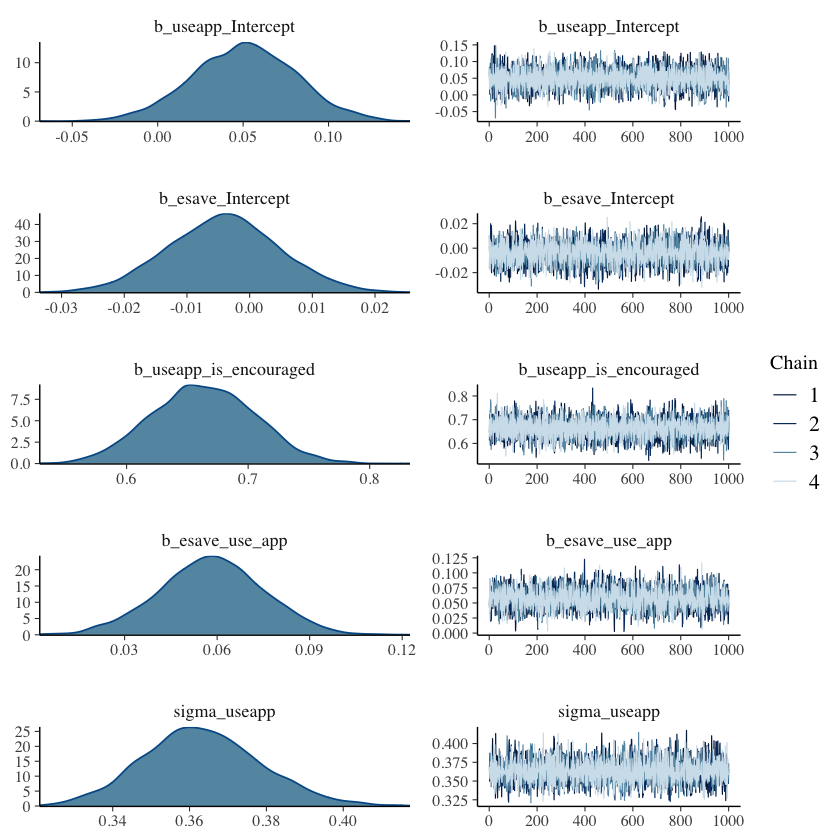

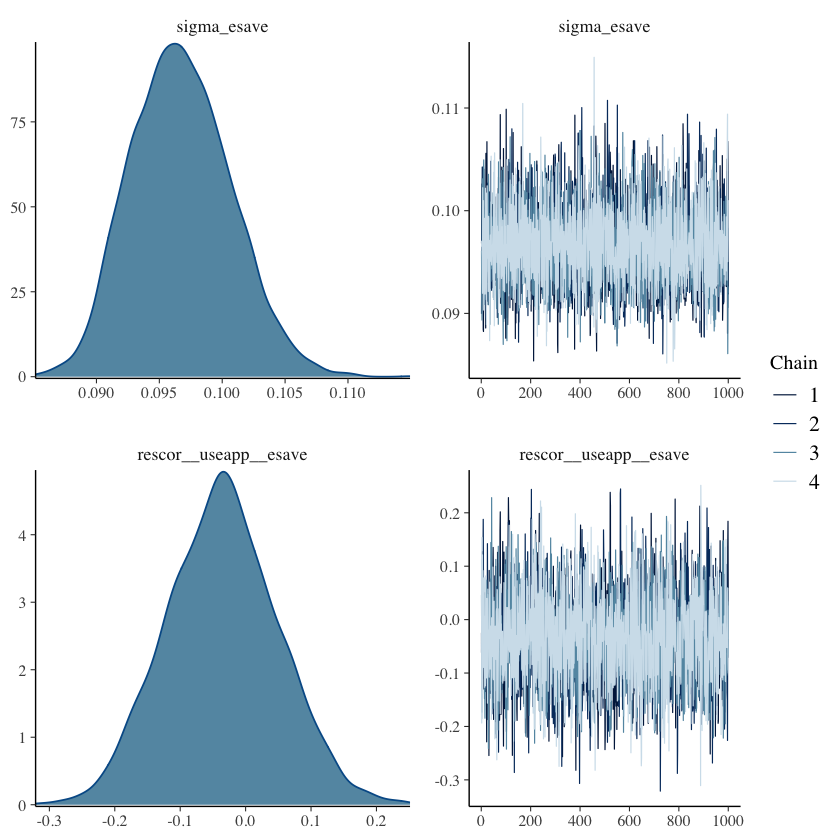

In [176]:
plot(IV_brm)